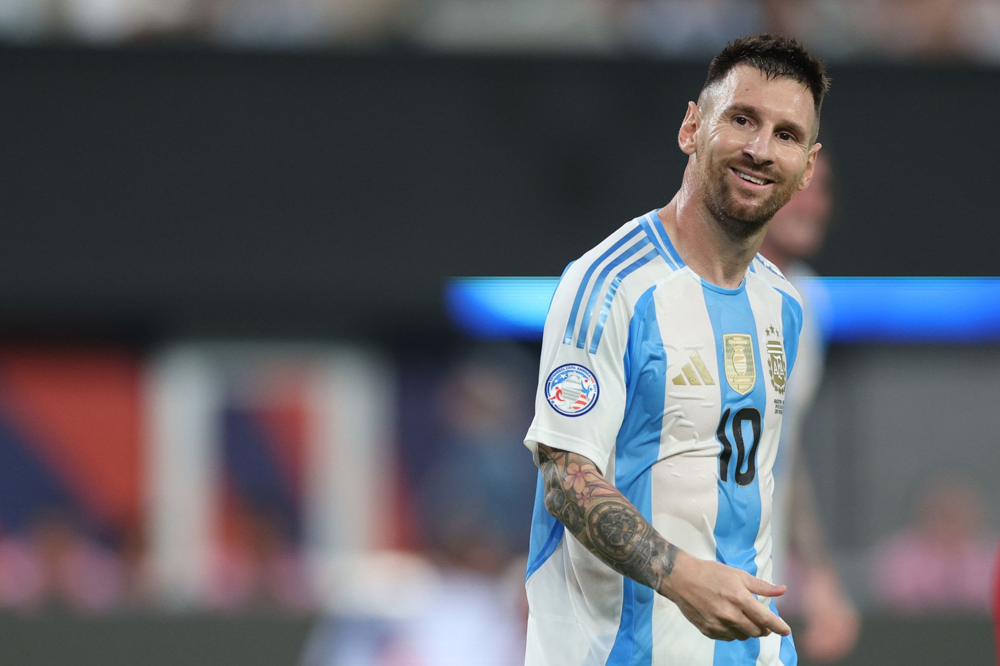

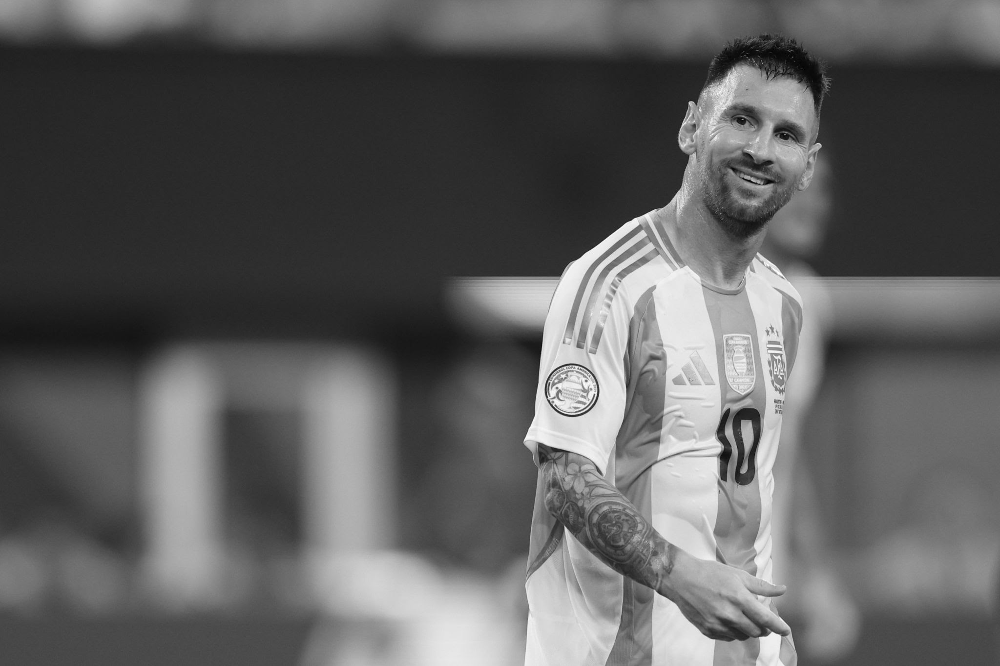

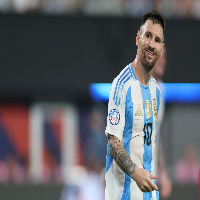

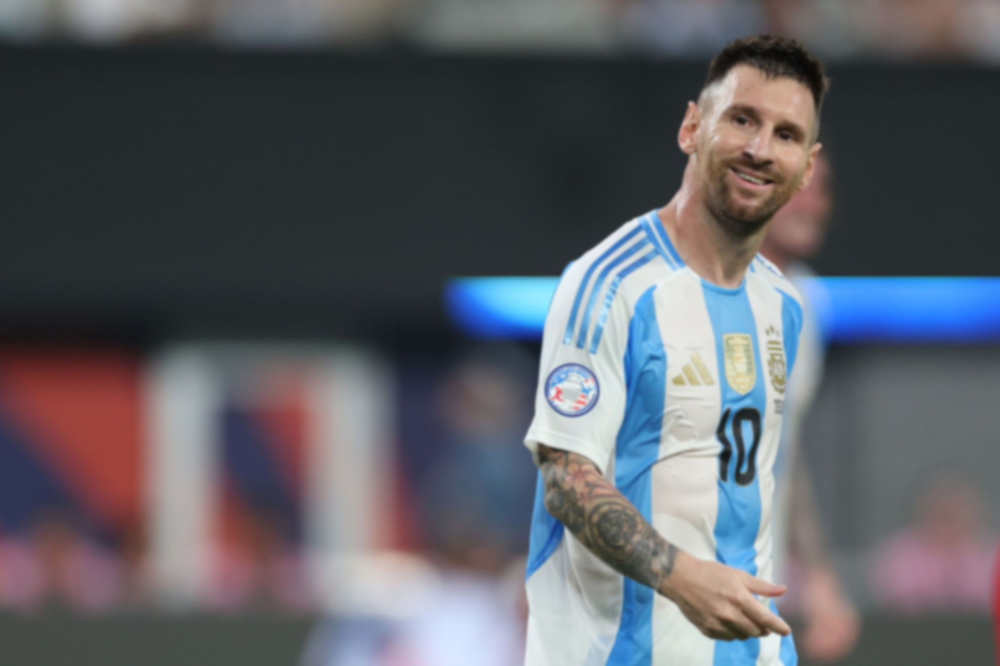

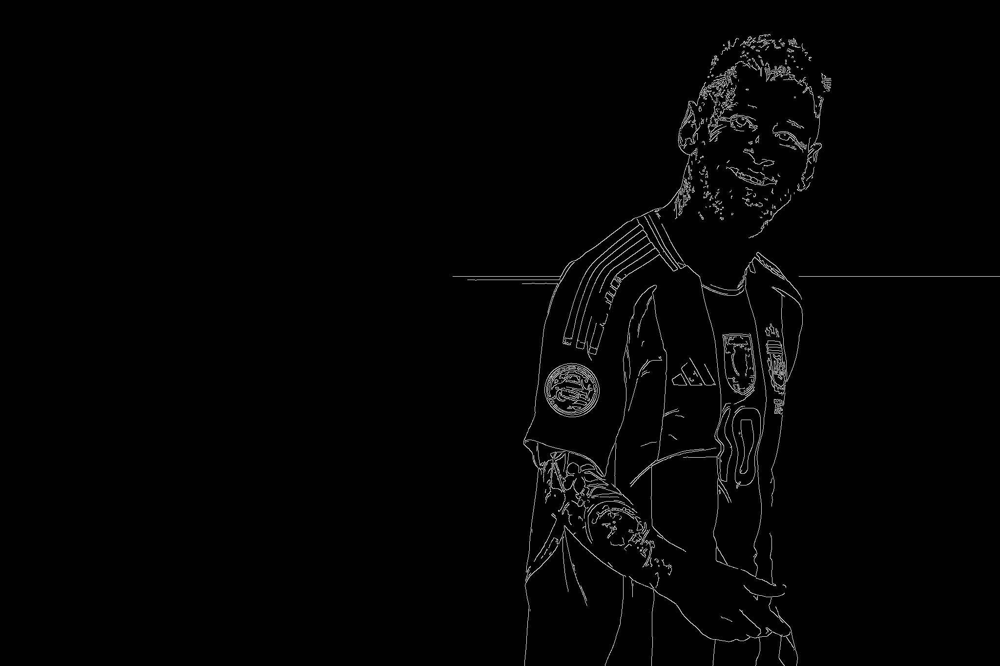

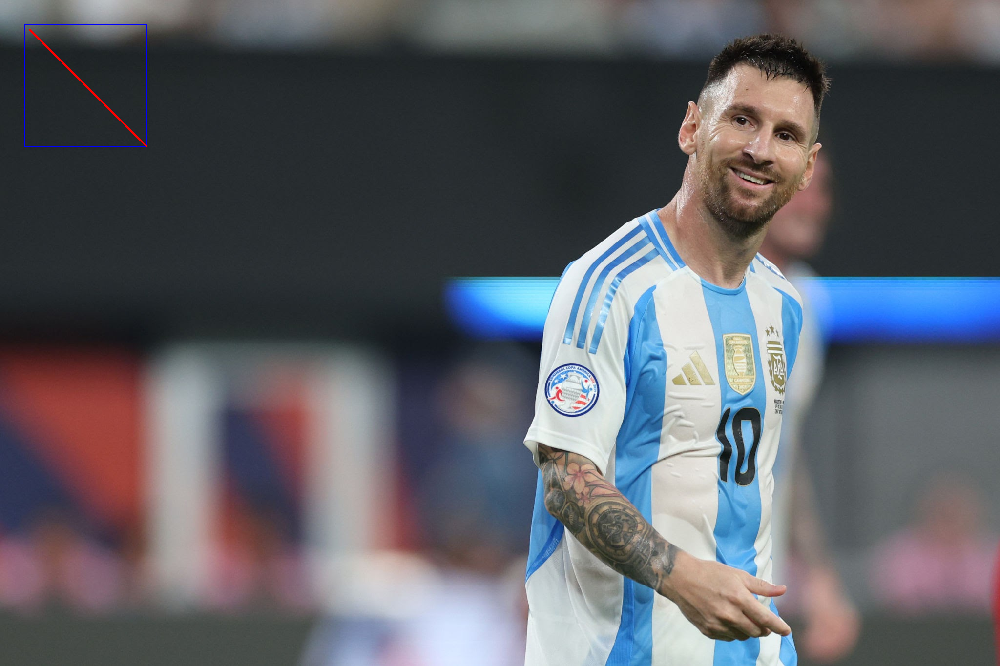

In [2]:
import cv2
from google.colab.patches import cv2_imshow
image=cv2.imread("image.jpeg")
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
resized_image = cv2.resize(image,(200,200))
cv2_imshow(resized_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
blurred_image = cv2.GaussianBlur(image, (15, 15), 0)
cv2_imshow(blurred_image)
cv2.waitKey(0)
cv2.destroyAllWindows()
edges = cv2.Canny(gray_image, 100, 200)
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.rectangle(image, (50,50), (300,300), (255, 0, 0), 2)
cv2.line(image, (60,60), (300,300), (0, 0, 255), 2)
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

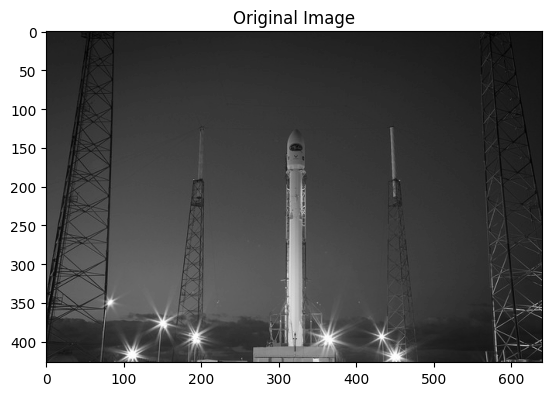

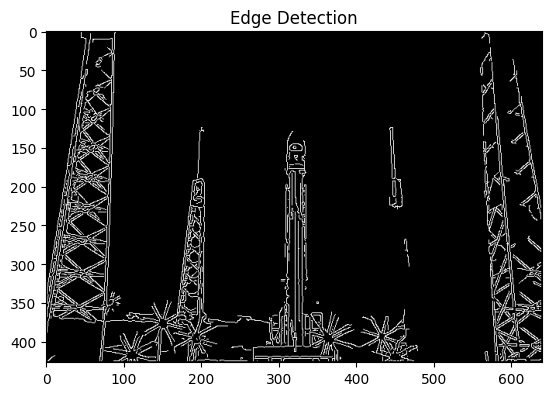

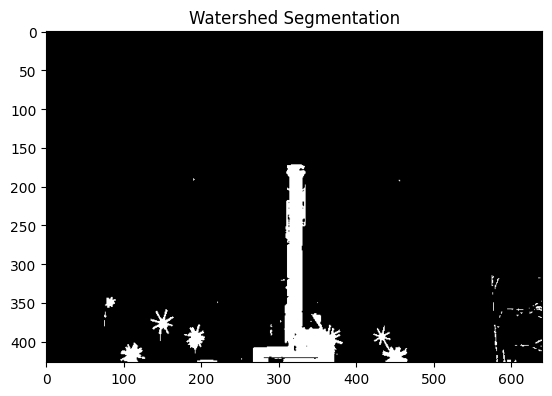

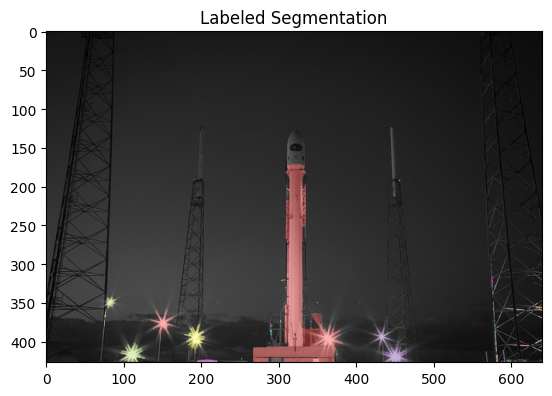

In [6]:
#region based segmentation
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import canny
from skimage.color import rgb2gray, label2rgb
from skimage.filters import sobel
from skimage import data, morphology
from skimage.segmentation import watershed
import scipy.ndimage as nd

# Convert image to grayscale
img = rgb2gray(data.rocket())

# Canny edge detection
ed = canny(img)

# Fill holes in the edges
fill = nd.binary_fill_holes(ed)

# Sobel filter
map = sobel(img)

# Markers for watershed
mark = np.zeros_like(img, dtype=int)
mark[img < 0.2] = 1
mark[img > 0.6] = 2

# Watershed segmentation
seg = watershed(map, mark)

# Fill holes in the segmentation
seg_fill = nd.binary_fill_holes(seg - 1)

# Label the regions
lab, _ = nd.label(seg_fill)

# Create a label image
img1 = label2rgb(lab, image=img)

# Display the images
plt.figure()
plt.title('Original Image')
plt.imshow(img, cmap='gray')

plt.figure()
plt.title('Edge Detection')
plt.imshow(ed, cmap='gray')

plt.figure()
plt.title('Watershed Segmentation')
plt.imshow(seg, cmap='gray')

plt.figure()
plt.title('Labeled Segmentation')
plt.imshow(img1)

plt.show()


24-08-12 17:04:32 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 50.3MB/s]


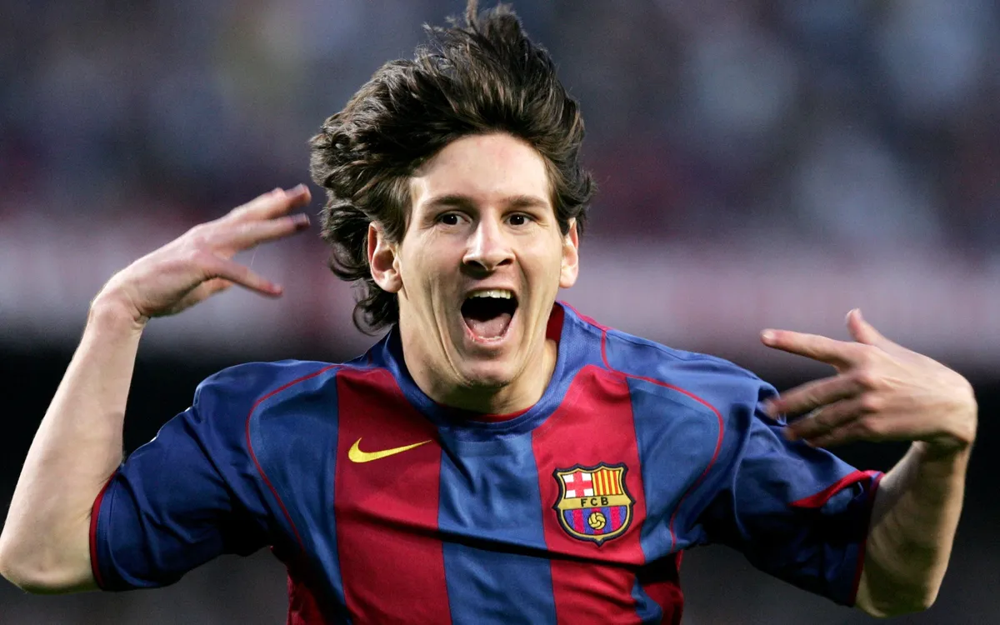

[{'emotion': {'angry': 7.763245521396932, 'disgust': 0.0023764608054193826, 'fear': 91.57736997874142, 'happy': 0.010930145224268932, 'sad': 0.008472962953812202, 'surprise': 0.637600867438213, 'neutral': 1.7475843132103855e-07}, 'dominant_emotion': 'fear', 'region': {'x': 453, 'y': 155, 'w': 262, 'h': 262, 'left_eye': (621, 262), 'right_eye': (539, 262)}, 'face_confidence': 0.89}]


In [10]:
 import cv2
 from deepface import DeepFace
 from google.colab.patches import cv2_imshow
 image=cv2.imread('emotion.webp')
 emotion=DeepFace.analyze(image,actions=['emotion'])
 cv2_imshow(image)
 print(emotion)


In [16]:
import cv2
from google.colab.patches import cv2_imshow
import time
import numpy as np

# Open video file
cap = cv2.VideoCapture("vid.mp4")

# Load pre-trained cascade classifier
cls = cv2.CascadeClassifier("vid.xml")

ctr = 0

while cap.isOpened():
    time.sleep(0.05)
    ret, frame = cap.read()

    if not ret:
        break

    # Convert frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect objects in the frame
    class1 = cls.detectMultiScale(gray, 1.4, 2)

    # Draw rectangles around detected objects
    for x, y, w, h in class1:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        ctr += 1

    # Display the frame
    cv2_imshow(frame)

# Release the video capture object and close windows
cap.release()
cv2.destroyAllWindows()

# Optional: Print total detected objects count
print(f"Total objects detected: {ctr}")


error: OpenCV(4.10.0) /io/opencv/modules/objdetect/src/cascadedetect.cpp:1689: error: (-215:Assertion failed) !empty() in function 'detectMultiScale'


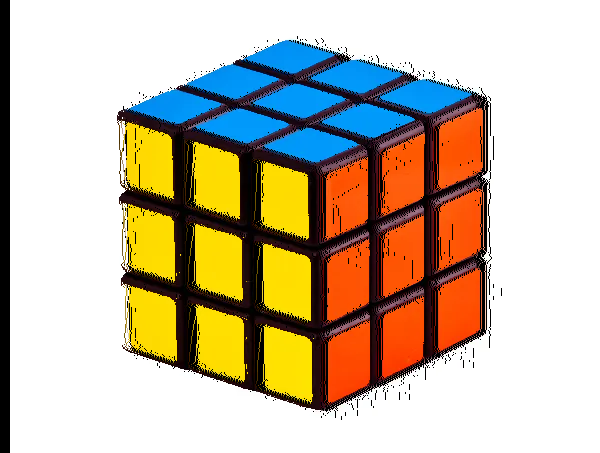

In [22]:
#2d to 3d
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Only needed for Colab

# Load the original and depth images
img = cv2.imread('cube.jpg', cv2.IMREAD_UNCHANGED)
dep = cv2.imread('cube.jpg', cv2.IMREAD_GRAYSCALE)

# Create the depth shift array
delta = (dep / 255.0 * 10).astype(int)

# Initialize an empty array with the same shape as the original image
arr = np.zeros_like(img)

# Apply the depth effect by shifting pixels
for y in range(img.shape[0]):
    for x in range(img.shape[1]):
        dx = delta[y, x]
        if 0 <= x + dx < img.shape[1]:
            arr[y, x + dx] = img[y, x]

# Display the resulting image
cv2_imshow(arr)  # Use cv2.imshow('Result', arr) if not using Colab
cv2.waitKey(0)
cv2.destroyAllWindows()


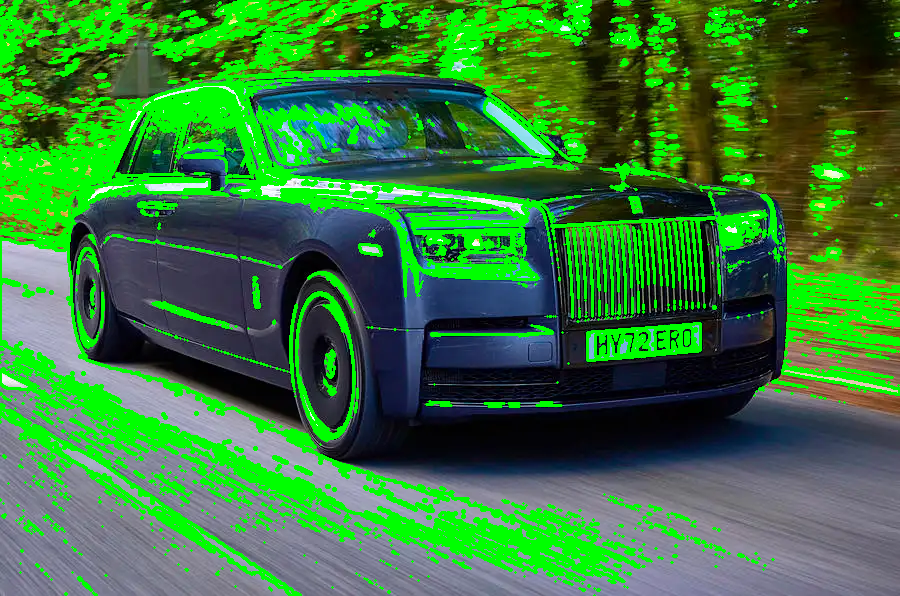

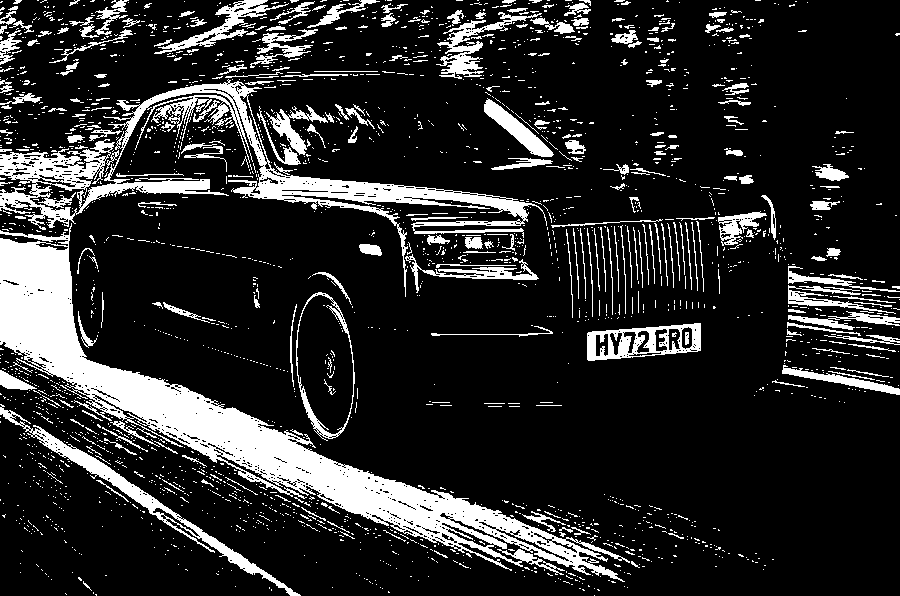

In [24]:
#contour segmentation
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Read the image
image = cv2.imread("rolls.webp")

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect edges using Canny
edges = cv2.Canny(gray, 150, 255)

# Apply threshold
ret, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY)

# Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Draw contours on the image
contour_image = image.copy()
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

# Display the images
cv2_imshow(contour_image)
cv2_imshow(thresh)
cv2.waitKey(0)
cv2.destroyAllWindows()


QR Code detected: https://me-qr.com/5eHXdupV


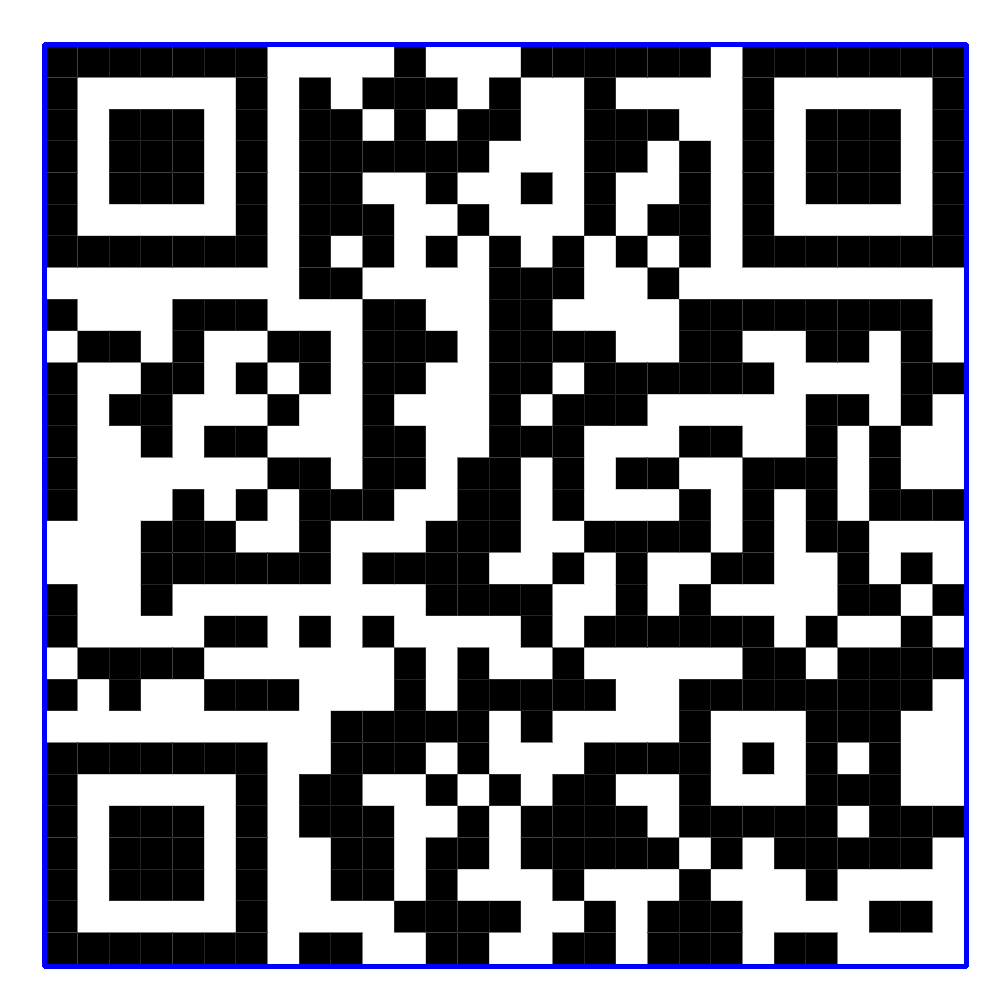

In [32]:
import cv2
from pyzbar.pyzbar import decode
from google.colab.patches import cv2_imshow
import numpy as np

# Read the image
frame = cv2.imread("qr.jpg")

# Check if the image was loaded successfully
if frame is not None:
    for qr in decode(frame):
        # Draw the polygon around the detected QR code
        cv2.polylines(frame, [np.array(qr.polygon, dtype=np.int32)], True, (255, 0, 0), 3)

        # Decode and print the QR code data
        print("QR Code detected:", qr.data.decode('utf-8'))

    # Display the frame with the detected QR code
    cv2_imshow(frame)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


In [29]:
!apt-get install libzbar0


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-double3 libgs9 libgs9-common libidn12 libijs-0.35
  libjbig2dec0 libjxr-tools libjxr0 liblqr-1-0 libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra
  libmagickwand-6.q16-6 libv4l-0 libv4lconvert0 libwmflite-0.2-7 poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre ghostscript-x libfftw3-bin
  libfftw3-dev inkscape poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-gothic fonts-arphic-ukai fonts-arphic-uming fonts-nanum
The following NEW packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-doub

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

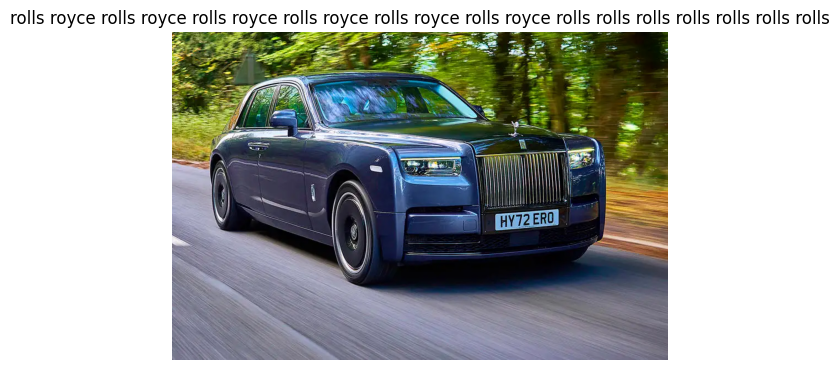

In [34]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
image_path = "rolls.webp"  # Replace with your local image path
image = Image.open(image_path).convert("RGB")

# Load the processor and model
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

# Process the image and generate the caption
inputs = processor(images=image, return_tensors="pt")
caption = processor.decode(model.generate(**inputs)[0], skip_special_tokens=True)

# Display the image with the generated caption
plt.imshow(image)
plt.title(caption)
plt.axis("off")
plt.show()


In [36]:
import cv2
import pytesseract

pytesseract.pytesseract.tesseract_cmd ='C:/Users/balum/AppData/Local/Programs/Tesseract-OCR/tesseract.exe'
# Define the image path
image_path = "C:/Users/balum/Downloads/quote.png"

# Load the image
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Extract text from the image using Tesseract
text = pytesseract.image_to_string(gray)

# Print the extracted text
print("Extracted Text:")
print(text)


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'
